In [1]:
# Основные фреймворки
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Отключение ворнингов
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Настройка визуализации
import matplotlib
TEXT_COLOR = 'black'

matplotlib.rcParams['figure.figsize'] = (15, 10)
matplotlib.rcParams['text.color'] = TEXT_COLOR
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['lines.markersize'] = 15
matplotlib.rcParams['axes.labelcolor'] = TEXT_COLOR
matplotlib.rcParams['xtick.color'] = TEXT_COLOR
matplotlib.rcParams['ytick.color'] = TEXT_COLOR

sns.set_style('darkgrid')

In [61]:
# Используемые фреймворки
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier

from sklearn.metrics import confusion_matrix, classification_report, plot_precision_recall_curve, plot_roc_curve

--------------

### Описание данных

In [4]:
data = pd.read_csv('water_potability.csv')
data.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


- pH - кислотно-щелочной баланс (6.5 - 8.5)
- Hardness - жесткость
- Solids - минерализация (500 - 1000)
- Chloramines - хлорированность (до 4 мг/л)
- Sulfate - сульфаты
- Conductivity - электропроводность (дл 400 мкСм/см)
- Organic_carbon - органический углерод
- Trihalomethanes - ТГМ - химические везщества в хлорированной воде (до 80)
- Turbidity - мутность
- Potability - пригодность (целевой признак)

In [5]:
target = data.Potability
features_columns = data.columns[:-1]

In [6]:
data.shape

(3276, 10)

In [7]:
# пропуски
nan = pd.DataFrame(data=[data.isna().sum(), round(100*data.isna().sum()/len(data), 2)], index=['NaN', 'NaN_%'])
nan

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
NaN,491.00,0.0,0.0,0.0,781.00,0.0,0.0,162.00,0.0,0.0
NaN_%,14.99,0.0,0.0,0.0,23.84,0.0,0.0,4.95,0.0,0.0


Пропуски значений в признаках: pH (14.99%), сульфаты (23.84%), ТГМ (4,95%).

In [8]:
# типы данных
data.dtypes

ph                 float64
Hardness           float64
Solids             float64
Chloramines        float64
Sulfate            float64
Conductivity       float64
Organic_carbon     float64
Trihalomethanes    float64
Turbidity          float64
Potability           int64
dtype: object

In [9]:
# максимальное, минимальное, среднее
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ph,2785.0,7.080795,1.594320,0.000000,6.093092,7.036752,8.062066,14.000000
Hardness,3276.0,196.369496,32.879761,47.432000,176.850538,196.967627,216.667456,323.124000
Solids,3276.0,22014.092526,8768.570828,320.942611,15666.690297,20927.833607,27332.762127,61227.196008
Chloramines,3276.0,7.122277,1.583085,0.352000,6.127421,7.130299,8.114887,13.127000
Sulfate,2495.0,333.775777,41.416840,129.000000,307.699498,333.073546,359.950170,481.030642
Conductivity,3276.0,426.205111,80.824064,181.483754,365.734414,421.884968,481.792304,753.342620
Organic_carbon,3276.0,14.284970,3.308162,2.200000,12.065801,14.218338,16.557652,28.300000
Trihalomethanes,3114.0,66.396293,16.175008,0.738000,55.844536,66.622485,77.337473,124.000000
Turbidity,3276.0,3.966786,0.780382,1.450000,3.439711,3.955028,4.500320,6.739000
Potability,3276.0,0.390110,0.487849,0.000000,0.000000,0.000000,1.000000,1.000000


- границы признаков значительно различаются, необходимо масштабировать;
- минерализация имеет высокое значение стандартного отклонения.

---------

### Описание признаков

**Целевая переменная**

In [10]:
# Количество значений каждого класса
data.Potability.value_counts()

0    1998
1    1278
Name: Potability, dtype: int64

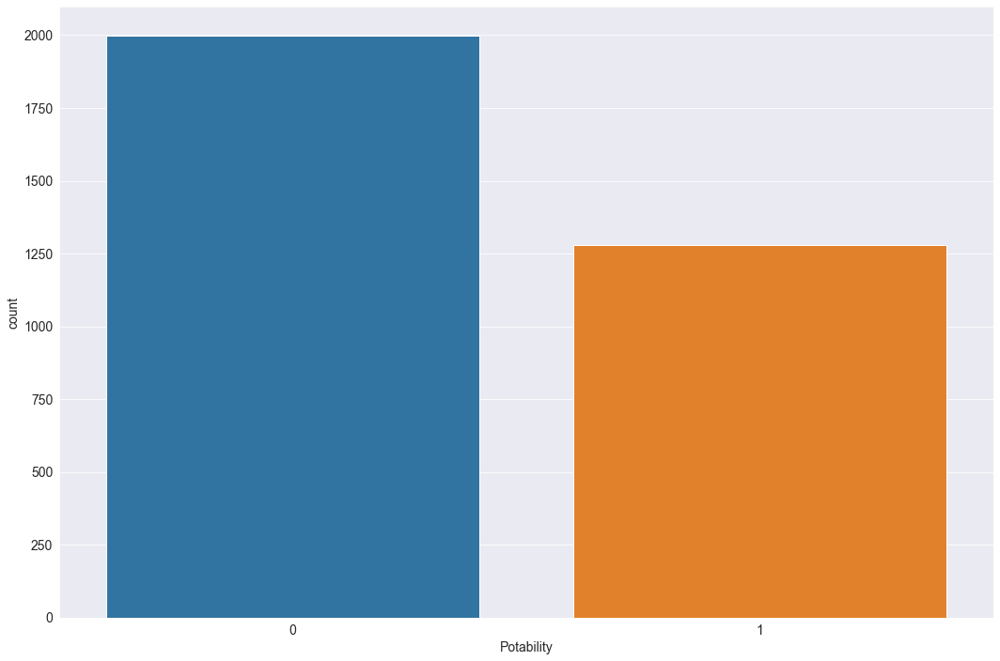

In [11]:
sns.countplot(data.Potability)
plt.tight_layout()

61% образцов являются непригодными, остальные 39% пригодны. В целевой переменной наблюдается небольшой дисбаланс классов.

--------

**Анализ остальных признаков**

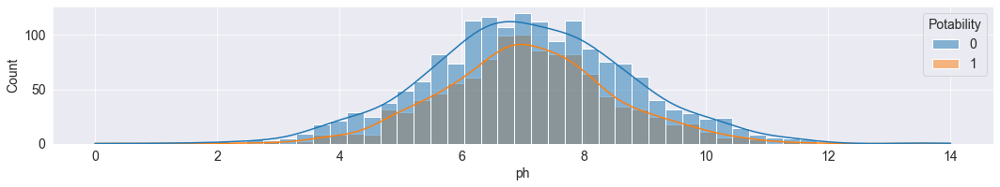

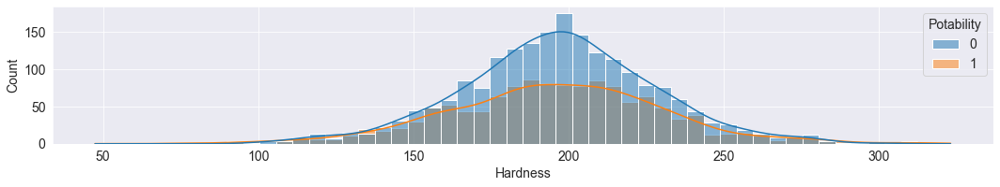

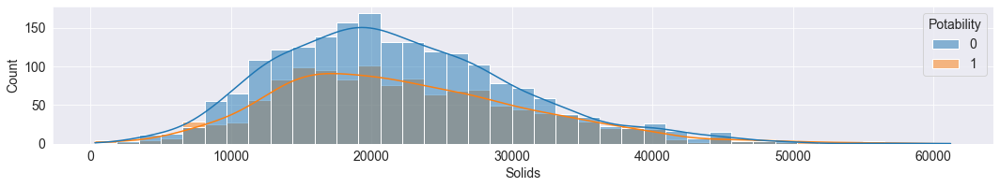

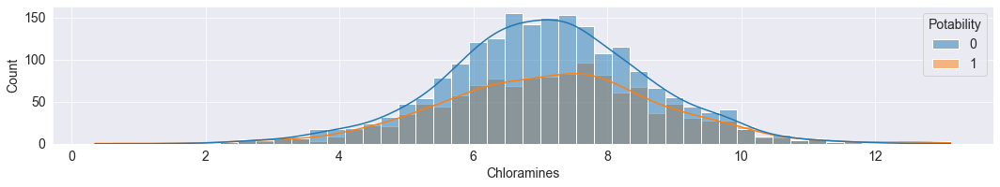

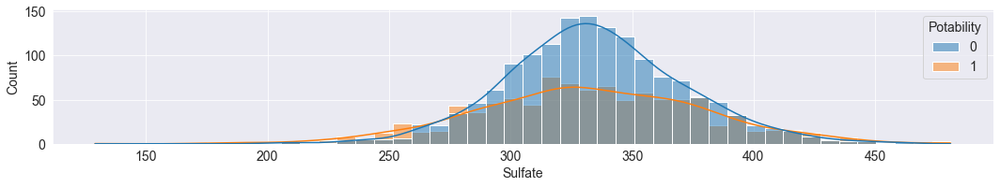

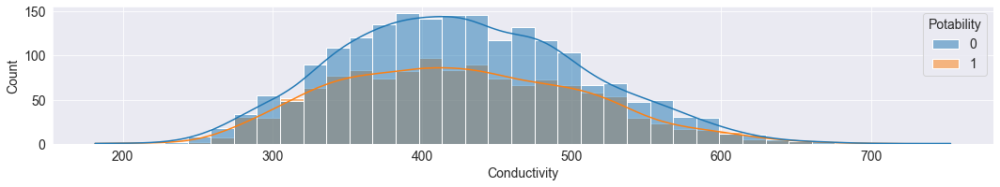

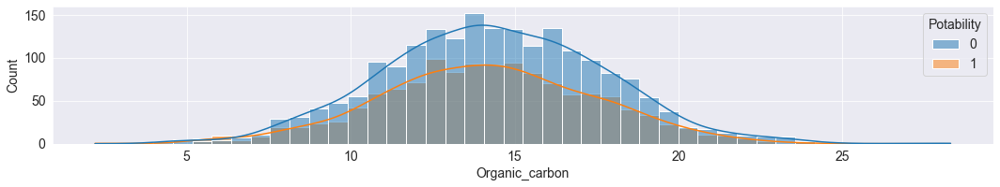

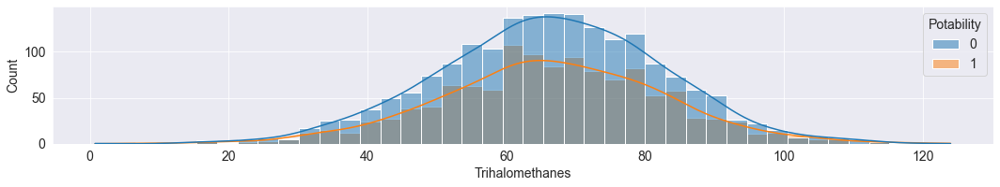

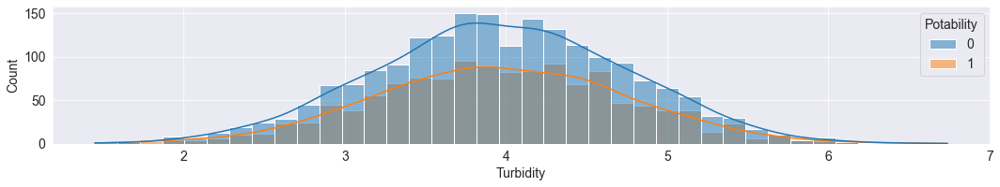

In [12]:
# Распределение признаков
for feature in features_columns:
    _ = plt.figure(figsize=(15,3))
    _ = sns.histplot(data=data, x=feature, hue='Potability', kde=True)
    plt.tight_layout()

По графикам можно сделать следующие выводы:
- нельзя выделить признак, в котором четко разделяется целевая переменная;
- формы графиков распределения близки к нормальному;
- в признаке Solids наблюдается небольшое смещение - "правый хвост".

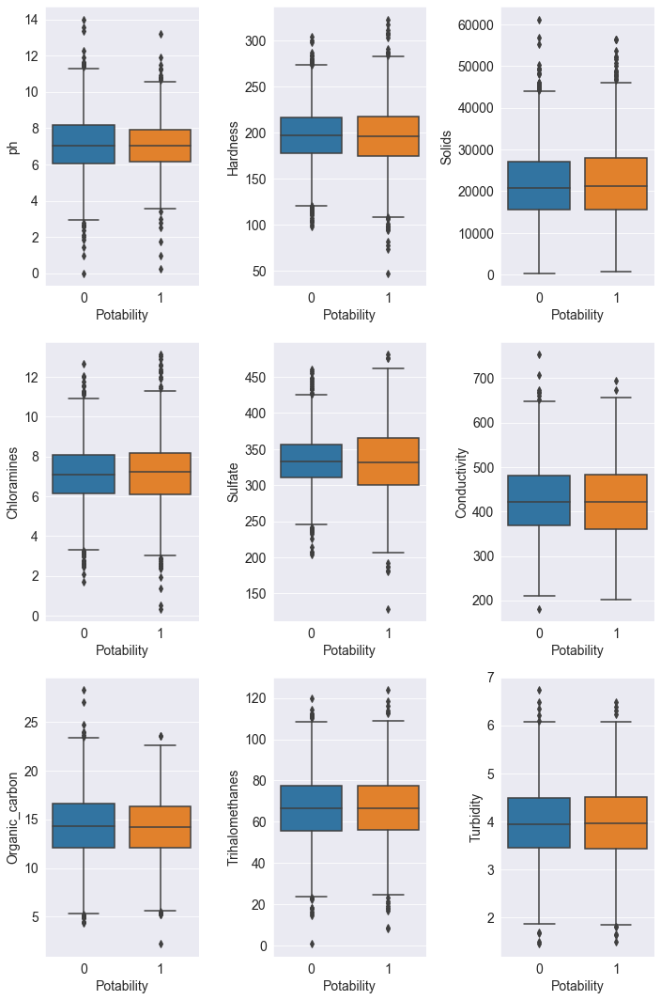

In [13]:
# Графики "ящика с усами"
plt.figure(figsize=(10,15))
for i in range(len(features_columns)):
    plt.subplot(3, 3, i+1)
    sns.boxplot(data=data, x='Potability', y=features_columns[i])
    plt.tight_layout()

- в признаках наблюдается выбросы;
- среднее значение в зависимости от классов не имеет значительного различия. 

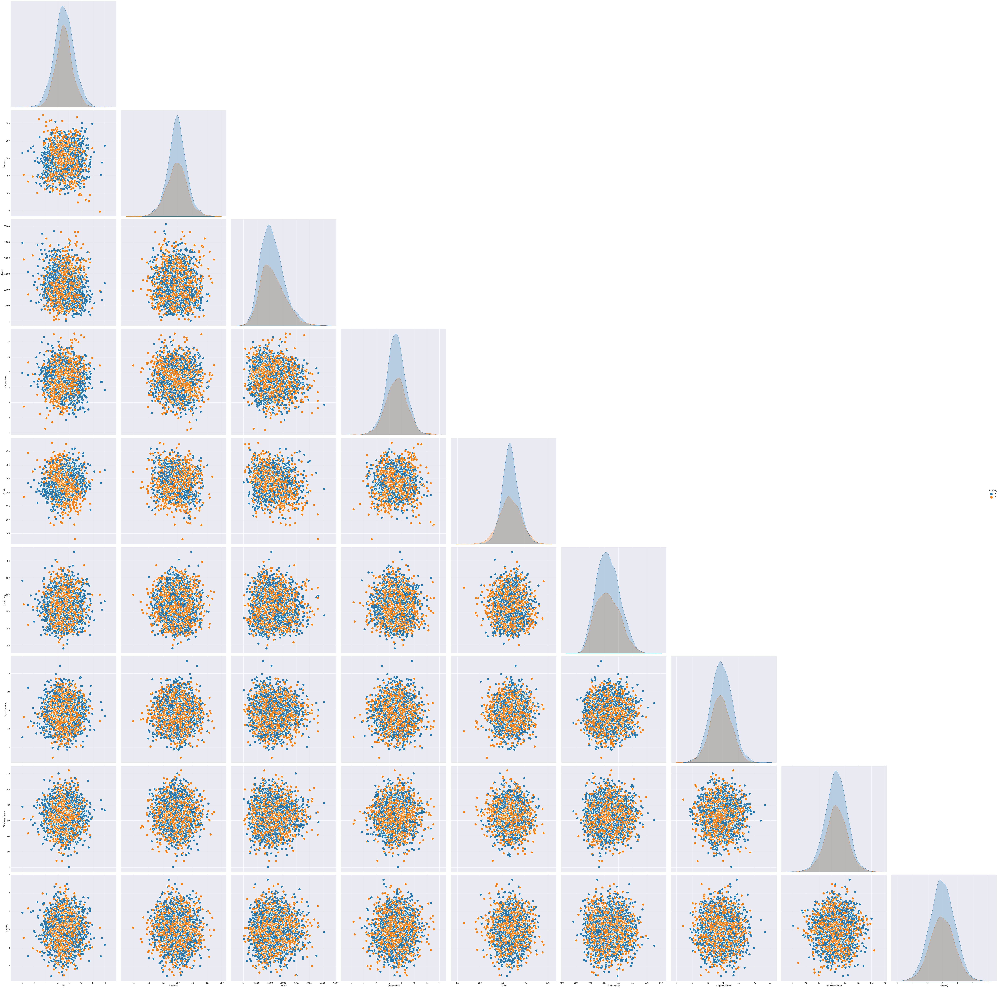

In [14]:
# График pairplot
sns.pairplot(data=data, dropna=False, hue='Potability', corner=True, height=10)
plt.tight_layout()

График pairplot подтверждает, что в признаках нет четкого разделения по целевому классу. В ряде графиков "пригодные" точки сконцентрированы в центре распределения всех наблюдений. Наблюдаются выбросы.

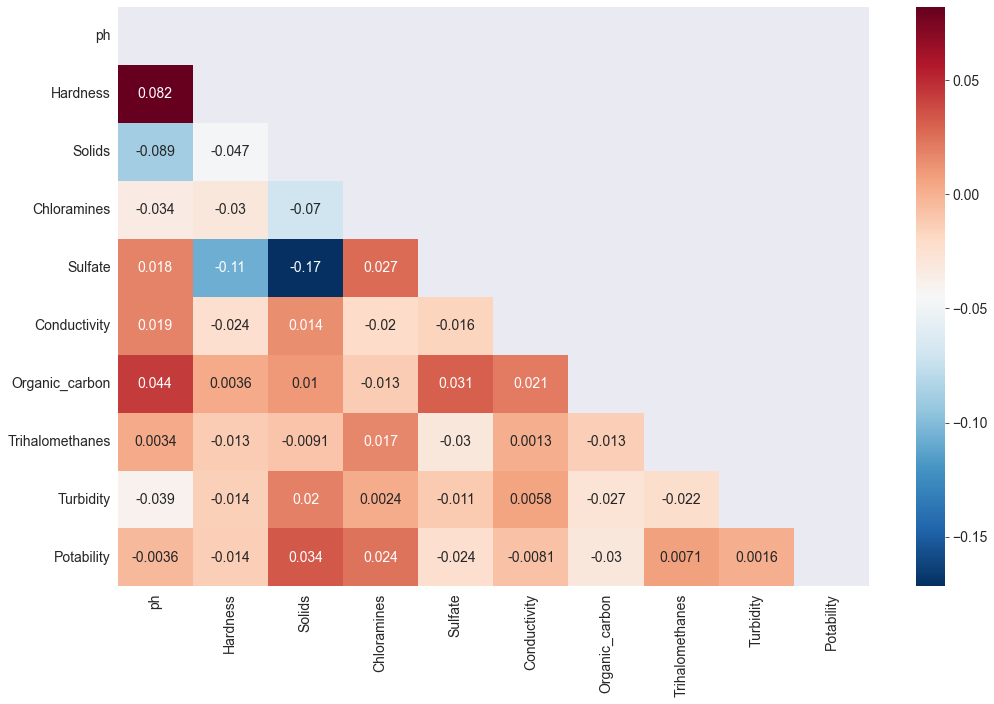

In [15]:
# Корреляция
corr_mtrx = data.corr()

mask = np.zeros_like(corr_mtrx)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr_mtrx, xticklabels=corr_mtrx.columns, yticklabels=corr_mtrx.columns, cmap='RdBu_r', annot=True, mask = mask)
plt.tight_layout()

Коэффициенты корреляции между признаками имеют малое значение, то есть в признаках нет ярко выраженной взаимосвязи. Также наблюдается малый коэффициент корреляции с целевой переменной. 

### Выводы и план предобработки

- в целевом признаке наблюдается незначительный дисбаланс, нет необходимости в исправлении;
- в данных присутствует большое количество пропусков, поэтому удаление наблюдений приведет к потери большой части набора;
- границы наблюдений значительно различаются, необходимо выполнить масштабирование;
- по анализу коэффициентов корреляции не выявлено явной зависимости между признаками и целевой переменной.

-------

### Предобработка

In [10]:
prep_data = data.copy()

**Заполнение пропущенных значений**

In [11]:
prep_data.dropna(inplace=False).shape

(2011, 10)

Так как в данных присутствует большое количество наблюдений с пропущенными значениями (1265 наблюдений), то удаление строк приведет к потери большой части набора данных (38,61%). Для заполнения пропусков воспользуемся медианным значением, так как в данных наблюдались выбросы. Сравним медианные значения в зависимости от значения целевого класса. 

In [12]:
features_nan = ['ph', 'Sulfate', 'Trihalomethanes']
pd.DataFrame(data=[data.loc[data.Potability==0][features_nan].median(), data.loc[data.Potability==1][features_nan].median()])

,ph,Sulfate,Trihalomethanes
0,7.035456,333.389426,66.542198
1,7.036752,331.838167,66.678214


Видно, что медианные значения в зависимости от класса имеют минимальное различие, поэтому заполнить пропуски можно общим медианным значением. 

In [13]:
# Заполнение пропущенных значений
def fill_nan(df, feature):
    df[feature].fillna(value=df[feature].median(), inplace=True)
    return df

In [14]:
for feature_nan in features_nan:
    prep_data = fill_nan(prep_data, feature_nan)
    
prep_data.isna().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

Проверка показала, что пропуски в наборах отсутствуют.

**Разделение на обучающую и тестовую выборки**

In [15]:
X = prep_data[features_columns]
y = target

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=42, shuffle=True)
print(f'Размер обучающей выборки: {X_train.shape}, \n{y_train.value_counts()}\n')
print(f'Размер тестовой выборки: {X_test.shape}, \n{y_test.value_counts()}')

Размер обучающей выборки: (2293, 9), 
0    1381
1     912
Name: Potability, dtype: int64

Размер тестовой выборки: (983, 9), 
0    617
1    366
Name: Potability, dtype: int64


**Масштабирование**

Так как признаки значительно различаются по значениям, то необходимо выполнить масштабирование.

In [17]:
# Масштабирование
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(data=scaler.transform(X_train), columns=X_train.columns, index=X_train.index)
X_test = pd.DataFrame(data=scaler.transform(X_test), columns=X_test.columns, index=X_test.index)

In [18]:
X_train.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
2985,-0.034446,-0.246998,0.750536,0.587582,1.340398,-0.054682,-1.117452,-0.203047,-0.938934
1073,0.079523,-0.856455,0.080096,-0.527665,-1.704672,0.130717,0.656002,-0.123028,3.126131
3140,-0.034446,1.410171,0.807459,-0.800215,0.188354,0.446057,-2.682430,0.010272,-0.560556
2643,-0.704456,0.463637,-1.986388,1.518663,-0.012824,-1.344653,1.068061,-0.813582,-0.772151
2174,1.705263,0.814997,0.694470,-0.919799,-0.012824,-0.345662,-0.881878,-1.378325,-0.037641


------------

### Моделирование

Рассмотрим основные модели классификации:
- Логистическая регрессия
- Случайный лес
- KNN

In [19]:
# функциb вывода метрик
def metrics(true, pred):
    cm = confusion_matrix(true, pred)

    plt.figure(figsize=(7,5))
    ax = sns.heatmap(cm, annot=True, fmt='.0f', xticklabels=['Непригодная', 'Пригодная'], yticklabels=['Непригодная', 'Пригодная'], cmap='RdBu_r')
    ax.set_ylabel('TRUE')
    ax.set_xlabel('PREDICT')
    plt.show()
    
    report = classification_report(true, pred)
    return print(report)

def PR_curve(model, df_test, y_test):
    fig, ax = plt.subplots(1, 1)

    plot_precision_recall_curve(model, df_test, y_test, pos_label=1, ax=ax, name='Пригодная')
    plot_precision_recall_curve(model, df_test, y_test, pos_label=0, ax=ax, name='Непригодная')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.show()
    
def roc_curve(model, df_test, y_test):
    fig, ax = plt.subplots(1, 1)

    plot_roc_curve(model, df_test, y_test, pos_label=1, ax=ax, name='Пригодная')
    plot_roc_curve(model, df_test, y_test, pos_label=0, ax=ax, name='Непригодная')
    plt.plot([0, 1], [0, 1], lw=2, linestyle='--')
    plt.xlabel('TPR')
    plt.ylabel('FPR')
    plt.show()

**Логистическая регрессия**

In [26]:
%%time
lr_model = LogisticRegression(random_state=42)
lr_params = {'C': np.arange(0.001, 1, 0.001)}

lr_grid = GridSearchCV(estimator=lr_model, param_grid=lr_params, scoring='f1_macro', cv=5)
lr_grid.fit(X_train, y_train)
lr_grid.best_params_

Wall time: 1min 9s


{'C': 0.225}

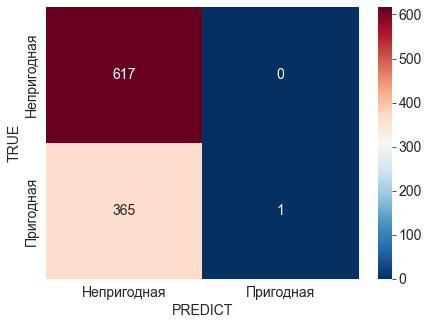

              precision    recall  f1-score   support

           0       0.63      1.00      0.77       617
           1       1.00      0.00      0.01       366

    accuracy                           0.63       983
   macro avg       0.81      0.50      0.39       983
weighted avg       0.77      0.63      0.49       983



In [27]:
lr_model = lr_grid.best_estimator_
lr_model.fit(X_train, y_train)
y_lr = lr_model.predict(X_test)
metrics(y_test, y_lr)

Точность модели составляет 63%, а F-мера 49%. Данные показатели метрик не являются удовлетворительными.

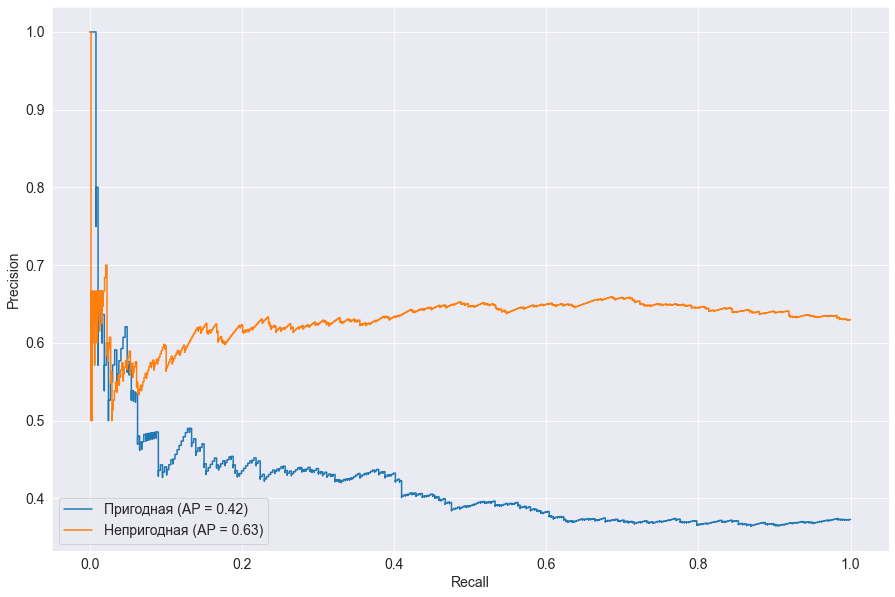

In [28]:
PR_curve(lr_model, X_test, y_test)

PR-график показывает, насколько модель хороша в целом. По полученным значениям AUC также можно сделать заключения, что модель логистической регрессии не является производительной. 

Также стоит отметить, что модель лучше размечает класс "Непригодной" воды.

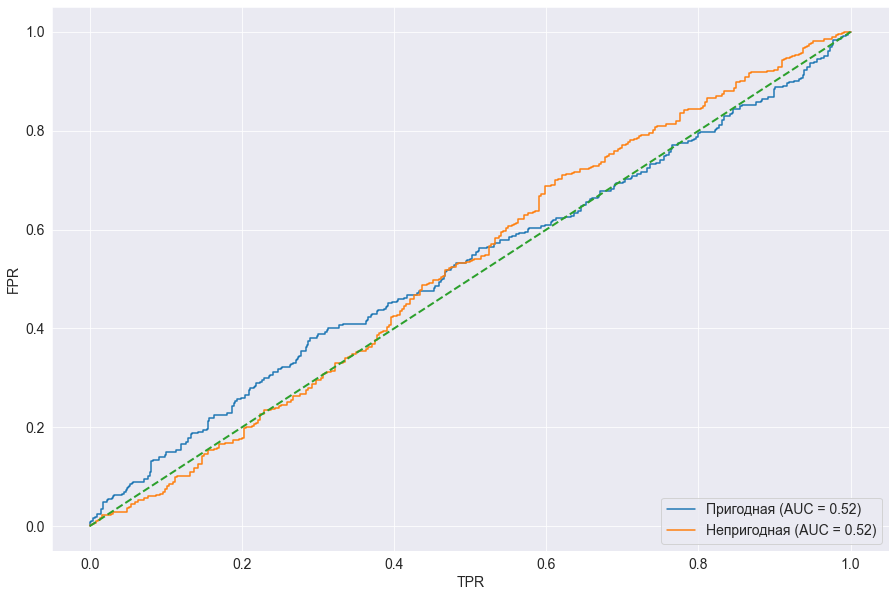

In [29]:
roc_curve(lr_model, X_test, y_test)

По ROC-графику видно, что модель находится на уровне порога AUC=0.5, который обозначает модель, предсказывающую всегда случайный класс из двух. То есть модель логистической регрессии ведет себя не лучше, чем обычная случайная модель.

**Случайный лес**

In [30]:
%%time
forest_model = RandomForestClassifier(random_state=42)
forest_params = {'n_estimators': np.arange(10, 150, 10),
                'max_depth': np.arange (2, 15, 2),
                'min_samples_leaf': np.arange(2, 10, 2)}

forest_grid = GridSearchCV(estimator=forest_model, param_grid=forest_params, scoring='f1_macro', cv=5)
forest_grid.fit(X_train, y_train)
forest_grid.best_params_

Wall time: 14min 48s


{'max_depth': 14, 'min_samples_leaf': 2, 'n_estimators': 20}

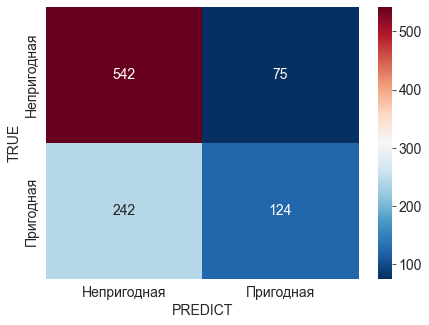

              precision    recall  f1-score   support

           0       0.69      0.88      0.77       617
           1       0.62      0.34      0.44       366

    accuracy                           0.68       983
   macro avg       0.66      0.61      0.61       983
weighted avg       0.67      0.68      0.65       983



In [31]:
forest_model = forest_grid.best_estimator_
forest_model.fit(X_train, y_train)
y_forest = forest_model.predict(X_test)
metrics(y_test, y_forest)

Точность модели составляет 68%, а F-мера 65%. Значения метрик показывают, что модель iForest дает лучшие результаты классификации чем модель логистической регрессии. 

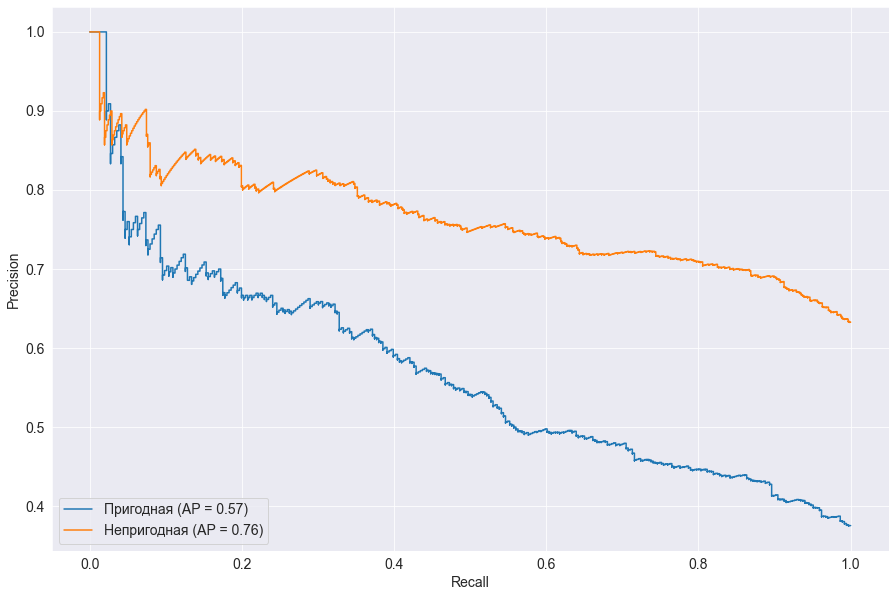

In [32]:
PR_curve(forest_model, X_test, y_test)

Значения AUC PR-кривых модели Изоляционного леса выше, чем в модели логистической регрессии. Модель также лучше определяет класс "Непригодной" воды.

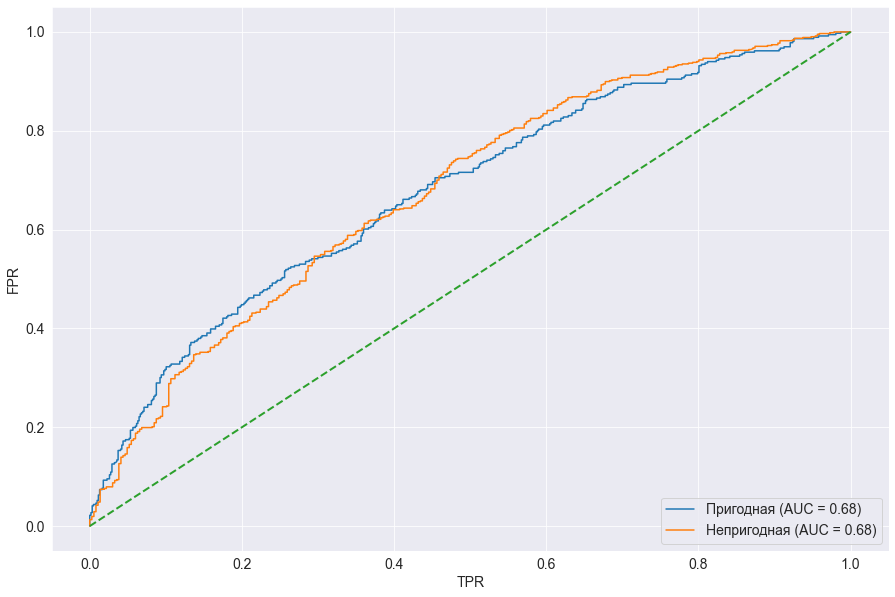

In [33]:
roc_curve(forest_model, X_test, y_test)

ROC-кривые располагаются выше уровня AUC=0.5, что подтверждает факт того, что модель лучше логистической регрессии. 

**К-ближайших соседей**

In [34]:
%%time
knn_model = KNeighborsClassifier()
knn_params = {'n_neighbors': np.arange(3, 50, 2)}

knn_grid = GridSearchCV(estimator=knn_model, param_grid=knn_params, scoring='f1_macro', cv=5)
knn_grid.fit(X_train, y_train)
knn_grid.best_params_

Wall time: 7.29 s


{'n_neighbors': 5}

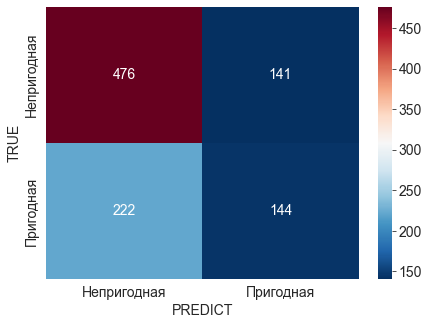

              precision    recall  f1-score   support

           0       0.68      0.77      0.72       617
           1       0.51      0.39      0.44       366

    accuracy                           0.63       983
   macro avg       0.59      0.58      0.58       983
weighted avg       0.62      0.63      0.62       983



In [35]:
knn_model = knn_grid.best_estimator_
knn_model.fit(X_train, y_train)
y_knn = knn_model.predict(X_test)
metrics(y_test, y_knn)

Показатели метрик модели Kmeans лучше, чем модели логистической регрессии, но хуже модели изоляционного леса. Однако модель обнаружила большое количество "Пригодной" воды. 

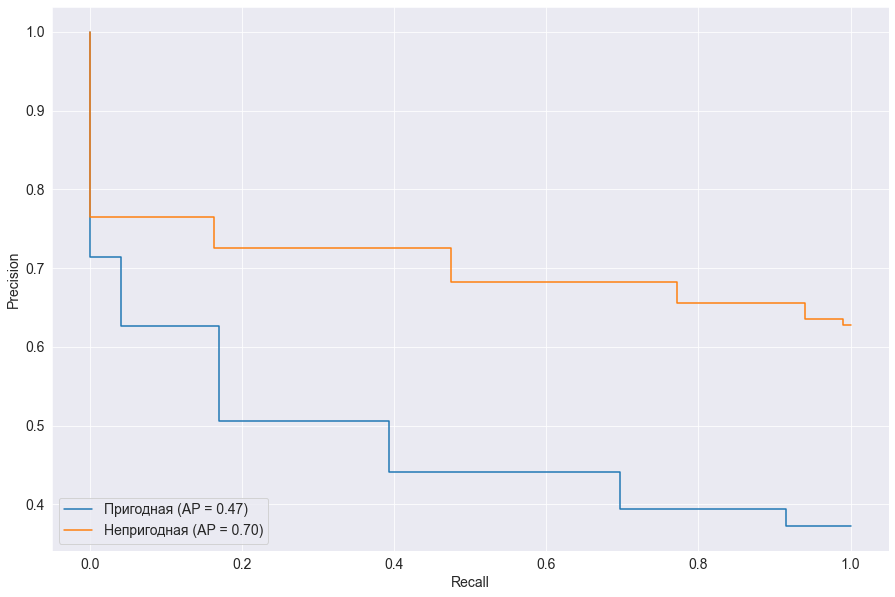

In [36]:
PR_curve(knn_model, X_test, y_test)

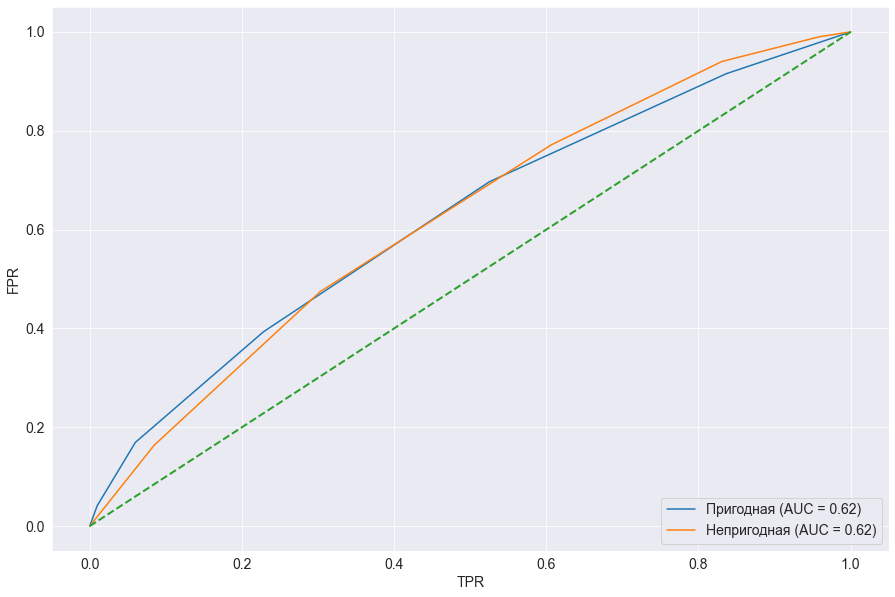

In [37]:
roc_curve(knn_model, X_test, y_test)

AUC PR-кривых и ROC-кривых больше, чем в модели логистической регресии, но меньше модели Изоляционного леса.

**Наивный Байесовский классификатор**

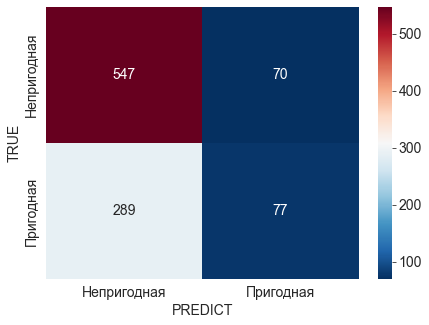

              precision    recall  f1-score   support

           0       0.65      0.89      0.75       617
           1       0.52      0.21      0.30       366

    accuracy                           0.63       983
   macro avg       0.59      0.55      0.53       983
weighted avg       0.61      0.63      0.58       983

Wall time: 317 ms


In [39]:
%%time
bayes_model = GaussianNB()
bayes_model.fit(X_train, y_train)

y_bayes = bayes_model.predict(X_test)
metrics(y_test, y_bayes)

Показатели метрик модели лучше, чем модели логистической регресии, но хуже моделей изоляционного леса и к-средних. Модель достаточно хорошо обнаруживает "Непригодный" класс, но допускает много ошибок в определении "Пригодного класса".

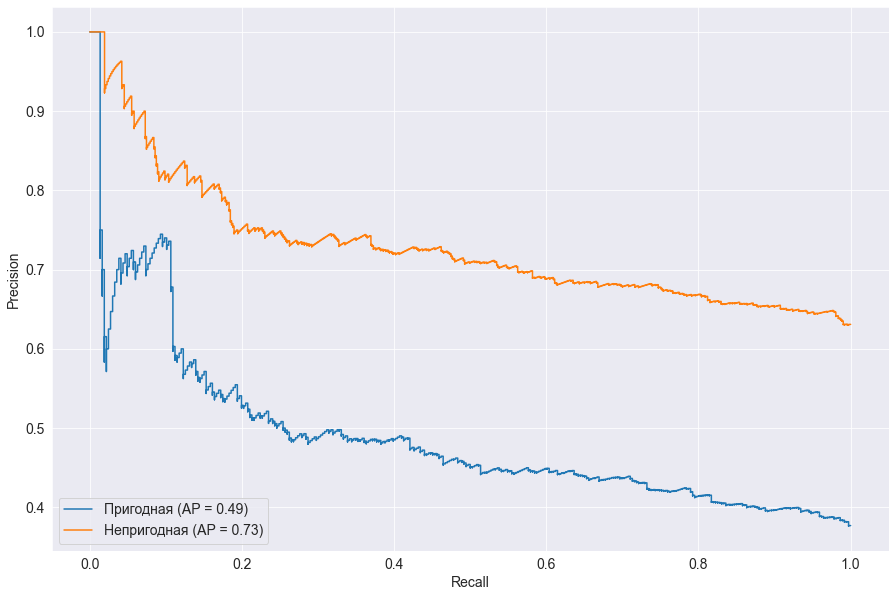

In [40]:
PR_curve(bayes_model, X_test, y_test)

AUC PR-кривых показывает, что модель действительно неплохо справляется в определении "Непригодного" класса, а значение AUC выше чем в модели к-средних.

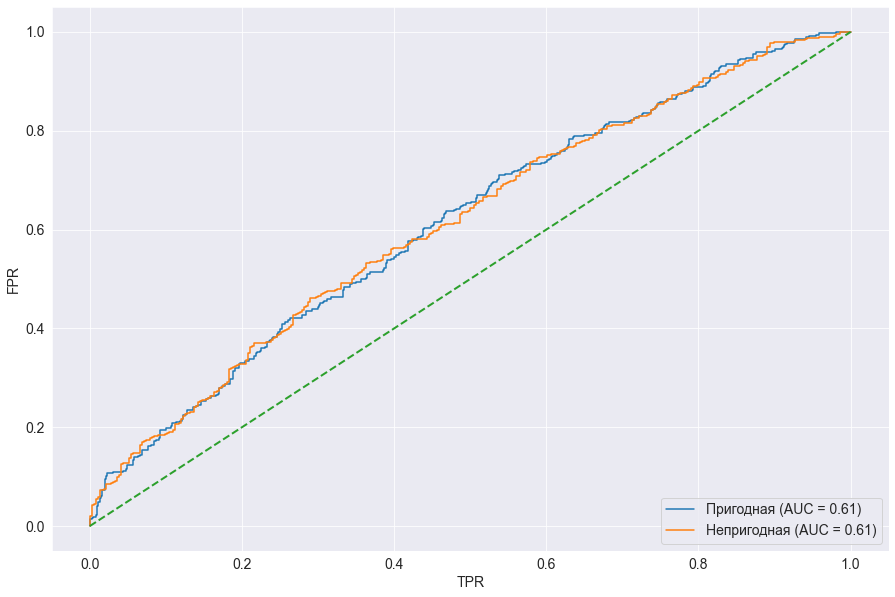

In [41]:
roc_curve(bayes_model, X_test, y_test)

ROC-кривые также находятся выше урвоня AUC=0.5, но имеет значения меньшее чем у моделей к-средних и изоляционного леса.

**Градиентый Бустинг**

In [45]:
%%time
grc_model = GradientBoostingClassifier(random_state=42)
grc_params = {'learning_rate': np.arange(0.01, 0.1, 0.02),
             'max_depth': np.arange(10, 100, 10),
             'n_estimators': np.arange(100, 500, 100)}

grc_grid = GridSearchCV(estimator=grc_model, param_grid=grc_params, scoring='f1_macro', cv=5)
grc_grid.fit(X_train, y_train)
grc_grid.best_params_

Wall time: 17h 30min 16s


{'learning_rate': 0.06999999999999999, 'max_depth': 10, 'n_estimators': 300}

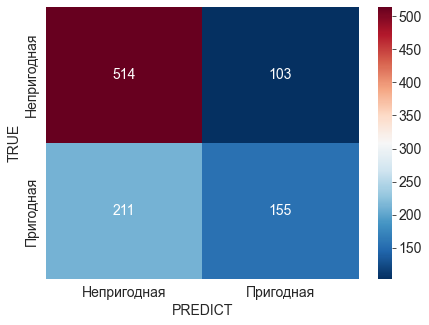

              precision    recall  f1-score   support

           0       0.71      0.83      0.77       617
           1       0.60      0.42      0.50       366

    accuracy                           0.68       983
   macro avg       0.65      0.63      0.63       983
weighted avg       0.67      0.68      0.67       983



In [58]:
grc_model = GradientBoostingClassifier(learning_rate=0.1, max_depth=7, n_estimators=300, random_state=42)
grc_model.fit(X_train, y_train)
y_grc = grc_model.predict(X_test)
metrics(y_test, y_grc)

Модель Градиентного Бустинга правильно классифицировала наибольшее количество "Пригодного" класса по сравнению с рассмотренными выше моделями. Кроме того, данная модель показывает наилучшие значения метрик из рассмотренных моделей.

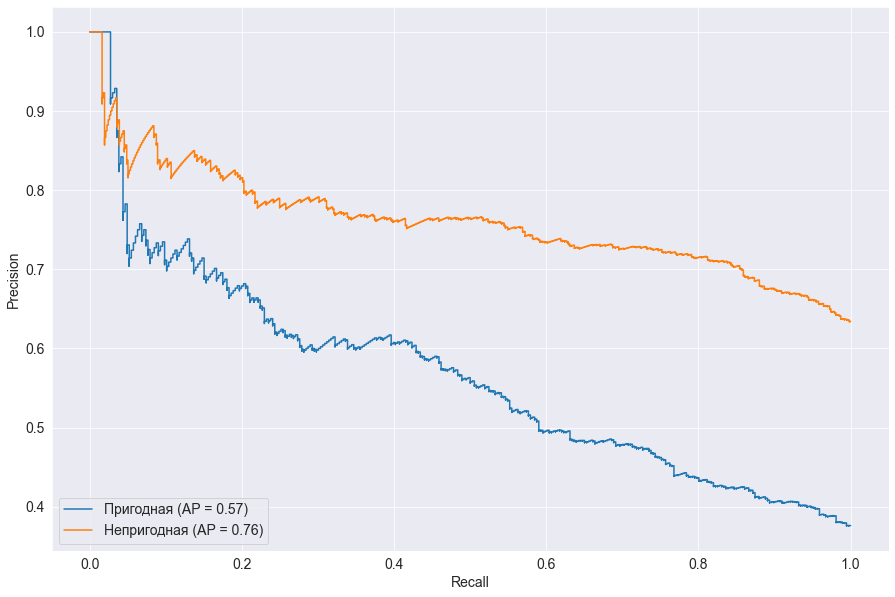

In [59]:
PR_curve(grc_model, X_test, y_test)

Значения AUC PR-кривых модели Градиентного Бустинга совпадает со значениями модели Изоляционного Леса, которая до этого демонстрировала лучшие показатели качества. 

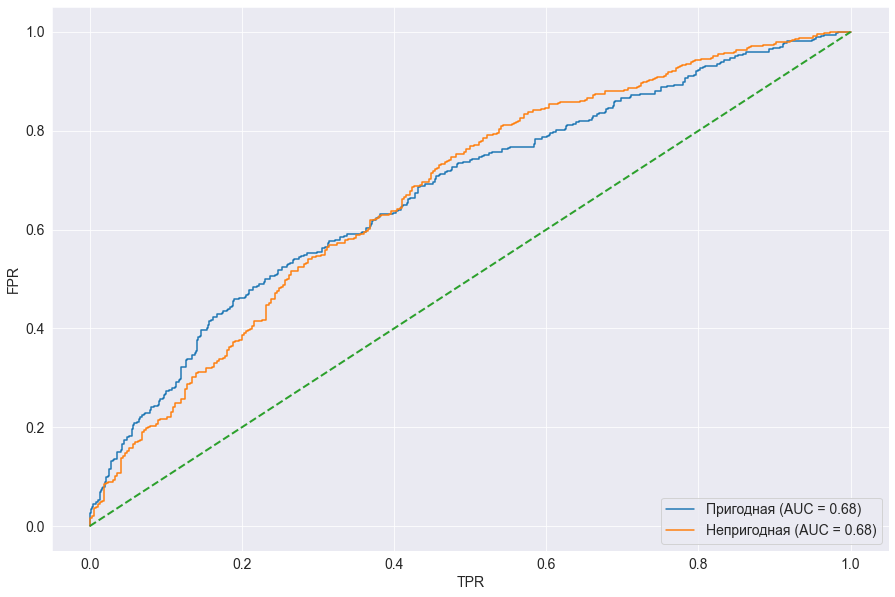

In [60]:
roc_curve(grc_model, X_test, y_test)

Значения AUC ROC-кривых модели Градиентного Бустинга также совпадает со значениями AUC Изоляционного Леса.

**AdaBoost**

In [62]:
%%time
ab_model = AdaBoostClassifier(random_state=42)
ab_params = {'learning_rate': np.arange(0.1, 0.5, 0.1),
             'n_estimators': np.arange(50, 500, 100)}

ab_grid = GridSearchCV(estimator=ab_model, param_grid=ab_params, scoring='f1_macro', cv=5)
ab_grid.fit(X_train, y_train)
ab_grid.best_params_

Wall time: 1min 33s


{'learning_rate': 0.30000000000000004, 'n_estimators': 350}

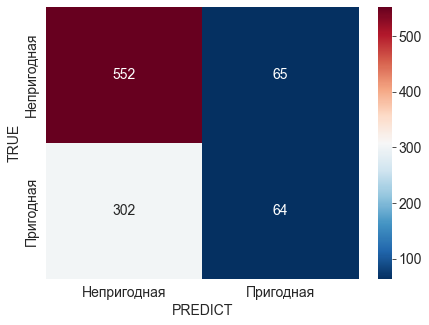

              precision    recall  f1-score   support

           0       0.65      0.89      0.75       617
           1       0.50      0.17      0.26       366

    accuracy                           0.63       983
   macro avg       0.57      0.53      0.50       983
weighted avg       0.59      0.63      0.57       983



In [63]:
ab_model = ab_grid.best_estimator_
ab_model.fit(X_train, y_train)
y_ab = ab_model.predict(X_test)
metrics(y_test, y_ab)

**Бэггинг**